In [1]:
import os
os.environ['KMP_DUPLICATE_LIB_OK']='True'
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn import preprocessing
from sklearn import svm
from sklearn.svm import SVR
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import confusion_matrix, classification_report, roc_curve
from sklearn.metrics import precision_score, accuracy_score, recall_score, f1_score, roc_auc_score
from sklearn.metrics import mean_squared_error
from math import sqrt
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
import pandas as pd
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
import xgboost as xgb
from sklearn.metrics import r2_score, auc
from sklearn.preprocessing import StandardScaler
import seaborn as sns
from scipy import stats
from scipy.stats import norm, skew 
from sklearn.preprocessing import PowerTransformer
import graphviz

In [2]:
def train_test_model(reg, X_train, y_train, X_test, y_test):
    reg.fit(X_train, y_train)
    y_train_pred = reg.predict(X_train)   # Make prediction on the training data
    y_test_pred = reg.predict(X_test)  # Make predictions on test data
    return y_train_pred, y_test_pred

In [4]:
df.loc[df['bandgap'] < 0].index

Int64Index([], dtype='int64')

/Users/afridshirsekar/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)

 mu = 0.91 and sigma = 0.65



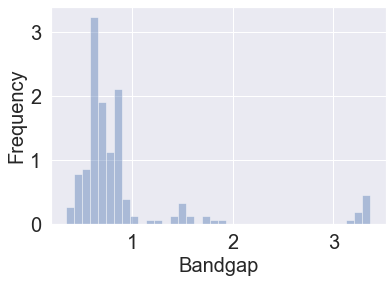

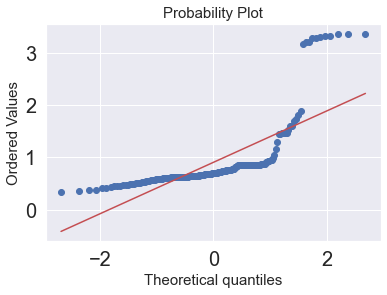

In [107]:
os.chdir('/Users/afridshirsekar/Desktop/PYTHON DIRECTORY/')
df = pd.read_csv('Compositions_ac.csv', sep = '\t')
df = df.drop([108], axis = 'index')
#df1[df1['bandgap'] < 0 ]
sns.distplot(df['bandgap'], norm_hist= True, kde = False)
(mu, sigma) = norm.fit(df['bandgap'])
print( '\n mu = {:.2f} and sigma = {:.2f}\n'.format(mu, sigma))
axis_font = {'fontname':'Arial', 'size':'20'}
plt.ylabel('Frequency', **axis_font)
plt.xlabel('Bandgap', **axis_font)
plt.rc('xtick', labelsize=20)
plt.rc('ytick', labelsize=20)
#Get also the QQ-plot
fig = plt.figure()
res = stats.probplot(df['bandgap'], plot=plt)
plt.show()

In [10]:
df2 = np.array(df['bandgap'])
df2= df2.reshape(-1,1)
#df_standardised = (power_transform(df2, method= 'box-cox'))
#print(type(df2['bandgap'])
#sns.displot(df_standardised)
#plt.show()
pt = PowerTransformer()
print(pt.fit(df2))
print(pt.lambdas_)
print(pt.transform(df2))

PowerTransformer()
[-3.29952972]
[[ 1.56325718]
 [ 1.56299514]
 [ 1.74414703]
 [ 1.67427425]
 [ 1.56358549]
 [ 1.61244482]
 [ 1.54522445]
 [ 1.54769891]
 [ 1.56081897]
 [ 1.67382678]
 [-0.33201852]
 [ 0.09558781]
 [-1.14117313]
 [-1.56878687]
 [-1.99715451]
 [-1.69145751]
 [-1.23290281]
 [-1.41257862]
 [-1.82944475]
 [-1.23506246]
 [-2.00825828]
 [-1.37494142]
 [-0.4704829 ]
 [-0.30480248]
 [-0.49996957]
 [-0.33220474]
 [-0.44268288]
 [-0.33047773]
 [-0.34438273]
 [-1.27515716]
 [-0.41394104]
 [-0.47170099]
 [-0.59953826]
 [-0.43983373]
 [-0.44720478]
 [-0.37235898]
 [-0.48628419]
 [-0.47489353]
 [-0.44088124]
 [-0.48985085]
 [-0.4853419 ]
 [-0.51629907]
 [-0.62982468]
 [-0.36817296]
 [-0.46831424]
 [-0.37353093]
 [-0.35775626]
 [-0.44814101]
 [-0.32603783]
 [-0.7228486 ]
 [-0.53387214]
 [-0.49166161]
 [-0.19895865]
 [-0.19956725]
 [-0.21493385]
 [-0.19154085]
 [-0.35033523]
 [-0.07508654]
 [ 0.45215222]
 [ 0.48186216]
 [ 0.4910109 ]
 [ 0.49224956]
 [ 0.46539308]
 [ 0.46460771]
 [ 0.46

/Users/afridshirsekar/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


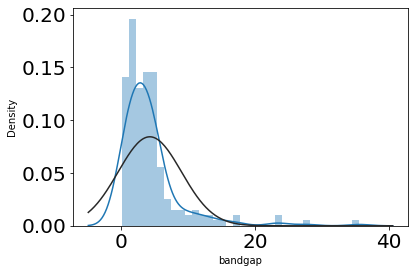

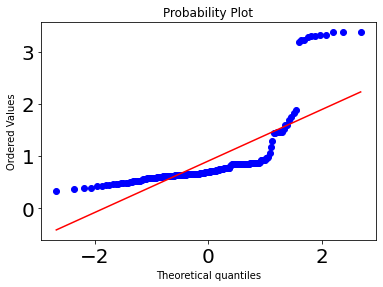

In [11]:
df3 = np.power(df['bandgap'], -3.2995272)
sns.distplot(df3, fit=norm)
plt.show()

fig = plt.figure()
res = stats.probplot(df['bandgap'], plot=plt)
plt.show()

<AxesSubplot:>

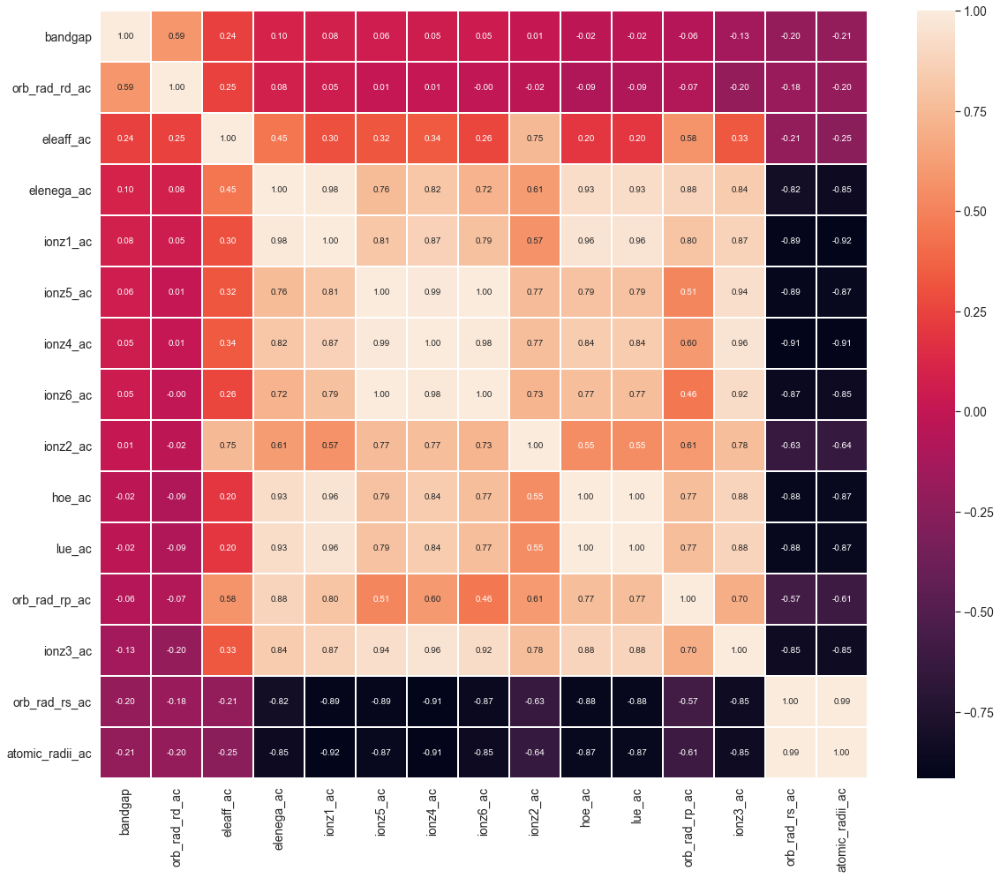

In [6]:
#df = df.drop(columns=['Unnamed: 0'])
x = (len(df.columns)) #number of explanatory variables in the dataframe
corrmat = df.corr(method = 'pearson')
cols = corrmat.nlargest(x, 'bandgap')['bandgap'].index
cormat = np.corrcoef(df[cols].values.T)
#print(cm)
f, ax = plt.subplots(figsize=(20, 16))
ax.set_ylim(len(cormat)-0.1, -0.1)
ax.set_xlim(len(cormat)-0.1, -0.1)
sns.set(font_scale=1.25)

sns.heatmap(cormat, annot=True, fmt='.2f', ax=ax,linewidth = 1,annot_kws={'size': 10},square = True,cbar=True,yticklabels=cols.values,xticklabels=cols.values)

# XGBOOST REGRESSION METHOD

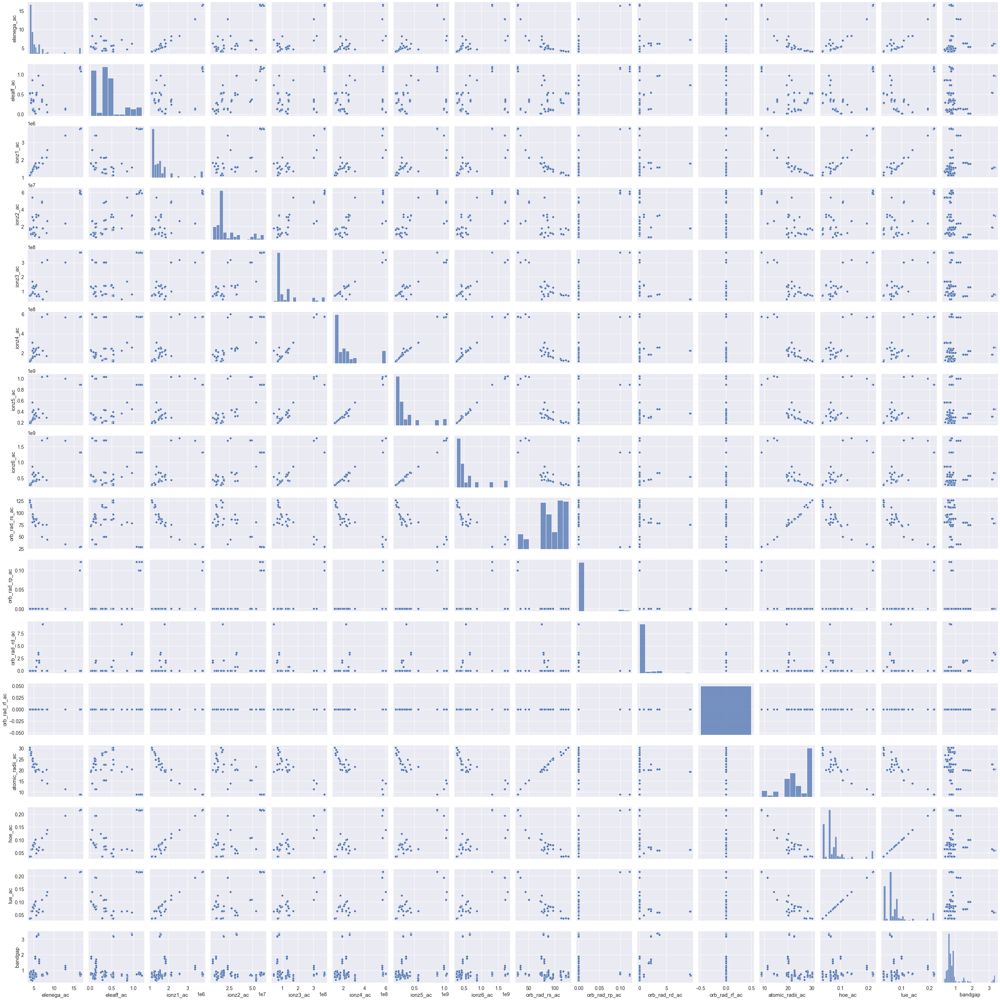

In [10]:
sns.pairplot(df)

In [7]:
df.columns

Index(['elenega_ac', 'eleaff_ac', 'ionz1_ac', 'ionz2_ac', 'ionz3_ac',
       'ionz4_ac', 'ionz5_ac', 'ionz6_ac', 'orb_rad_rs_ac', 'orb_rad_rp_ac',
       'orb_rad_rd_ac', 'orb_rad_rf_ac', 'atomic_radii_ac', 'hoe_ac', 'lue_ac',
       'bandgap'],
      dtype='object')

In [50]:
X = df.drop('bandgap', axis= 1)  #explanatory variables
y = df['bandgap'] #response variable

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

estimator = xgb.XGBRegressor()
print(estimator.get_params().keys())
param_grid = {
    'max_depth': [ 5, 6, 8],
    'learning_rate': [ 0.01, 0.03, 0.05, 0.1],
    'min_child_weight': [6, 8], 
    'gamma': [ 0.03, 0.11, 0.3, 0.5],
    'subsample': [ 0.3, 0.52],
    'colsample_bytree': [ 0.3, 0.5],
    'reg_alpha': [ 0.05, 0.1, 0.3]}
    
gbm = GridSearchCV(estimator, param_grid, scoring='neg_median_absolute_error', cv=7, verbose=10, n_jobs=4,return_train_score=True)
gbm.fit(X_train,y_train)
print(gbm.cv_results_)
print('best parameters: {} '.format(gbm.best_params_))
print('best scores: {}'.format(np.abs(gbm.best_score_)))
best = gbm.best_estimator_

, {'colsample_bytree': 0.5, 'gamma': 0.5, 'learning_rate': 0.01, 'max_depth': 6, 'min_child_weight': 8, 'reg_alpha': 0.05, 'subsample': 0.3}, {'colsample_bytree': 0.5, 'gamma': 0.5, 'learning_rate': 0.01, 'max_depth': 6, 'min_child_weight': 8, 'reg_alpha': 0.05, 'subsample': 0.52}, {'colsample_bytree': 0.5, 'gamma': 0.5, 'learning_rate': 0.01, 'max_depth': 6, 'min_child_weight': 8, 'reg_alpha': 0.1, 'subsample': 0.3}, {'colsample_bytree': 0.5, 'gamma': 0.5, 'learning_rate': 0.01, 'max_depth': 6, 'min_child_weight': 8, 'reg_alpha': 0.1, 'subsample': 0.52}, {'colsample_bytree': 0.5, 'gamma': 0.5, 'learning_rate': 0.01, 'max_depth': 6, 'min_child_weight': 8, 'reg_alpha': 0.3, 'subsample': 0.3}, {'colsample_bytree': 0.5, 'gamma': 0.5, 'learning_rate': 0.01, 'max_depth': 6, 'min_child_weight': 8, 'reg_alpha': 0.3, 'subsample': 0.52}, {'colsample_bytree': 0.5, 'gamma': 0.5, 'learning_rate': 0.01, 'max_depth': 8, 'min_child_weight': 6, 'reg_alpha': 0.05, 'subsample': 0.3}, {'colsample_bytree'

The rmse for the model is: 0.1728641084699714
The MAE for the model is: 0.11747981197713553


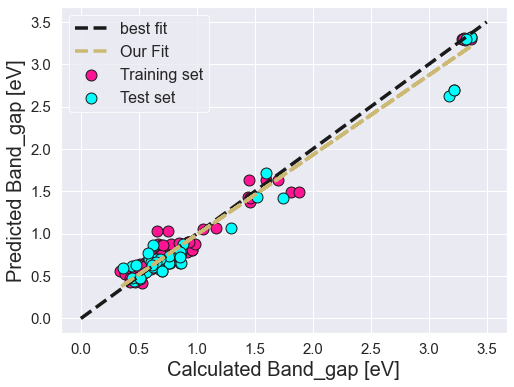

In [53]:


x_ref_line = [0, 3.5]
y_ref_line = [0, 3.5]
x1 = np.array(y_train)
y1 = np.array(y_pred_train)
x2 = np.array(y_test)
y2 = np.array(y_pred_test)
y_pred_train = best.predict(X_train)
y_pred_test = best.predict(X_test)
print('The rmse for the model is:', mean_squared_error(y_test, y_pred_test) ** 0.5)
print('The MAE for the model is:', mean_absolute_error(y_test, y_pred_test))

fig = plt.figure(figsize=(8, 6))
plt.scatter(x1, y1, s=120, c='deeppink', edgecolors='k', linewidths=1, label='Training set')
plt.scatter(x2, y2, s=120, c='cyan', edgecolors='k', linewidths=1, label='Test set')

plt.plot(x_ref_line, y_ref_line, 'k--', linewidth=3.5, label = 'best fit')

z = np.polyfit(x1, y1, 1)
p = np.poly1d(z)
plt.plot(x1,p(x1),'y--', linewidth=3.5, label='Our Fit')

plt.rc('xtick', labelsize=20)
plt.rc('ytick', labelsize=20)
plt.xlabel('Calculated Band_gap [eV]', fontsize = 20)
plt.ylabel('Predicted Band_gap [eV]', fontsize = 20)
plt.tick_params(axis='both', labelsize = 15)
plt.legend(loc='upper left', fontsize = 16, ncol = 1).get_frame().set_edgecolor('w')
plt.grid(True)


In [98]:
X = df.drop('bandgap', axis= 1)  #explanatory variables
X = X.drop('bandgap_categorical', axis = 1)
y = df['bandgap'] #response variable

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

estimator = xgb.XGBRegressor()
print(estimator.get_params().keys())
param_grid = {
    'max_depth': [8],
    'learning_rate': [ 0.1],
    'min_child_weight': [6], 
    'gamma': [ 0.03],
    'subsample': [ 1],
    'colsample_bytree': [0.7, 0.73, 0.75, 0.77],
    'reg_alpha': [0.1]}
    
gbm = GridSearchCV(estimator, param_grid, scoring='neg_median_absolute_error', cv=7, verbose=10, n_jobs=4,return_train_score=True)
gbm.fit(X_train,y_train)
print(gbm.cv_results_)
print('best parameters: {} '.format(gbm.best_params_))
print('best scores: {}'.format(np.abs(gbm.best_score_)))
best = gbm.best_estimator_

dict_keys(['objective', 'base_score', 'booster', 'colsample_bylevel', 'colsample_bynode', 'colsample_bytree', 'gamma', 'gpu_id', 'importance_type', 'interaction_constraints', 'learning_rate', 'max_delta_step', 'max_depth', 'min_child_weight', 'missing', 'monotone_constraints', 'n_estimators', 'n_jobs', 'num_parallel_tree', 'random_state', 'reg_alpha', 'reg_lambda', 'scale_pos_weight', 'subsample', 'tree_method', 'validate_parameters', 'verbosity'])
Fitting 7 folds for each of 4 candidates, totalling 28 fits
[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done   5 tasks      | elapsed:    4.2s
[Parallel(n_jobs=4)]: Done  10 tasks      | elapsed:    5.0s
[Parallel(n_jobs=4)]: Done  17 tasks      | elapsed:    6.7s
[Parallel(n_jobs=4)]: Done  24 out of  28 | elapsed:    7.7s remaining:    1.3s
[Parallel(n_jobs=4)]: Done  28 out of  28 | elapsed:    8.5s finished
{'mean_fit_time': array([0.88092875, 0.81895631, 0.88496184, 0.86456289]), 'std

The rmse for the training model is: 0.08680250371690146
The rmse for the model is: 0.1327743128435146
The MAE of train prediction is: 0.0669438104512566
The MAE for the model is: 0.10721505878799843


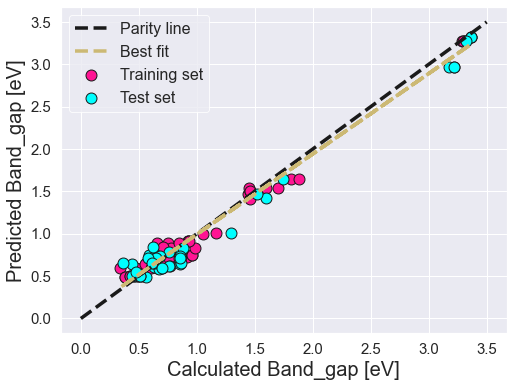

In [99]:
x_ref_line = [0, 3.5]
y_ref_line = [0, 3.5]
y_pred_train = best.predict(X_train)
y_pred_test = best.predict(X_test)
x1 = np.array(y_train)
y1 = np.array(y_pred_train)
x2 = np.array(y_test)
y2 = np.array(y_pred_test)

print('The rmse for the training model is:', mean_squared_error(y_train, y_pred_train) ** 0.5)
print('The rmse for the model is:', mean_squared_error(y_test, y_pred_test) ** 0.5)
print('The MAE of train prediction is:', mean_absolute_error(y_train, y_pred_train))
print('The MAE for the model is:', mean_absolute_error(y_test, y_pred_test))

fig = plt.figure(figsize=(8, 6))
plt.scatter(x1, y1, s=120, c='deeppink', edgecolors='k', linewidths=1, label='Training set')
plt.scatter(x2, y2, s=120, c='cyan', edgecolors='k', linewidths=1, label='Test set')

plt.plot(x_ref_line, y_ref_line, 'k--', linewidth=3.5, label = 'Parity line')

z = np.polyfit(x1, y1, 1)
p = np.poly1d(z)
plt.plot(x1,p(x1),'y--', linewidth=3.5, label='Best fit')

plt.rc('xtick', labelsize=20)
plt.rc('ytick', labelsize=20)
plt.xlabel('Calculated Band_gap [eV]', fontsize = 20)
plt.ylabel('Predicted Band_gap [eV]', fontsize = 20)
plt.tick_params(axis='both', labelsize = 15)
plt.legend(loc='upper left', fontsize = 16, ncol = 1).get_frame().set_edgecolor('w')
plt.grid(True)

# OLD STRUCTURES TEST

The rmse for the training model is: 0.07513051031362417
The rmse for the model is: 1.5274545075133446
The MAE of train prediction is: 0.05218065889985938
The MAE for the model is: 1.3000029295159579


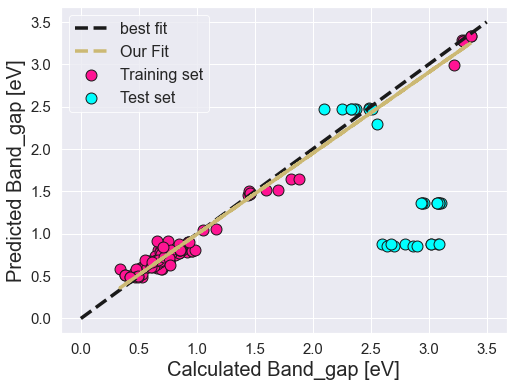

In [22]:
x_ref_line = [0, 3.5]
y_ref_line = [0, 3.5]
y_pred_train = best.predict(X_train)
y_pred_test = best.predict(X_test)
x1 = np.array(y_train)
y1 = np.array(y_pred_train)
x2 = np.array(y_test)
y2 = np.array(y_pred_test)

print('The rmse for the training model is:', mean_squared_error(y_train, y_pred_train) ** 0.5)
print('The rmse for the model is:', mean_squared_error(y_test, y_pred_test) ** 0.5)
print('The MAE of train prediction is:', mean_absolute_error(y_train, y_pred_train))
print('The MAE for the model is:', mean_absolute_error(y_test, y_pred_test))

fig = plt.figure(figsize=(8, 6))
plt.scatter(x1, y1, s=120, c='deeppink', edgecolors='k', linewidths=1, label='Training set')
plt.scatter(x2, y2, s=120, c='cyan', edgecolors='k', linewidths=1, label='Test set')

plt.plot(x_ref_line, y_ref_line, 'k--', linewidth=3.5, label = 'best fit')

z = np.polyfit(x1, y1, 1)
p = np.poly1d(z)
plt.plot(x1,p(x1),'y--', linewidth=3.5, label='Our Fit')

plt.rc('xtick', labelsize=20)
plt.rc('ytick', labelsize=20)
plt.xlabel('Calculated Band_gap [eV]', fontsize = 20)
plt.ylabel('Predicted Band_gap [eV]', fontsize = 20)
plt.tick_params(axis='both', labelsize = 15)
plt.legend(loc='upper left', fontsize = 16, ncol = 1).get_frame().set_edgecolor('w')
plt.grid(True)

In [21]:
df_old_test_structures = pd.read_csv('Compositions_ac_old_test_structures.csv', sep= '\t')
df_old_test_structures_testing_set = df_old_test_structures.sample(32)
X_test = df_old_test_structures_testing_set.drop('bandgap', axis = 1)
y_test = df_old_test_structures_testing_set['bandgap']
#print(df_old_test_structures.head())

In [25]:
X = df.drop('bandgap', axis= 1)  #explanatory variables
#X = X.drop('bandgap_categorical', axis = 1)
y = df['bandgap'] #response variable

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

estimator = xgb.XGBRegressor()
print(estimator.get_params().keys())
param_grid = {
    'max_depth': [8],
    'learning_rate': [ 0.1],
    'min_child_weight': [6], 
    'gamma': [ 0.03],
    'subsample': [ 1],
    'colsample_bytree': [0.7, 0.73, 0.75, 0.77],
    'reg_alpha': [0.1]}
    
gbm = GridSearchCV(estimator, param_grid, scoring='neg_median_absolute_error', cv=7, verbose=10, n_jobs=4,return_train_score=True)
gbm.fit(X_train,y_train)
print(gbm.cv_results_)
print('best parameters: {} '.format(gbm.best_params_))
print('best scores: {}'.format(np.abs(gbm.best_score_)))
best = gbm.best_estimator_

dict_keys(['objective', 'base_score', 'booster', 'colsample_bylevel', 'colsample_bynode', 'colsample_bytree', 'gamma', 'gpu_id', 'importance_type', 'interaction_constraints', 'learning_rate', 'max_delta_step', 'max_depth', 'min_child_weight', 'missing', 'monotone_constraints', 'n_estimators', 'n_jobs', 'num_parallel_tree', 'random_state', 'reg_alpha', 'reg_lambda', 'scale_pos_weight', 'subsample', 'tree_method', 'validate_parameters', 'verbosity'])
Fitting 7 folds for each of 4 candidates, totalling 28 fits
[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done   5 tasks      | elapsed:    3.2s
[Parallel(n_jobs=4)]: Done  10 tasks      | elapsed:    4.1s
[Parallel(n_jobs=4)]: Done  17 tasks      | elapsed:    6.2s
[Parallel(n_jobs=4)]: Done  24 out of  28 | elapsed:    7.7s remaining:    1.3s
[Parallel(n_jobs=4)]: Done  28 out of  28 | elapsed:    9.1s finished
{'mean_fit_time': array([1.62952723, 1.01223482, 1.10111659, 1.39944959]), 'std

# XGBOOST API_BASED VISUALISATION


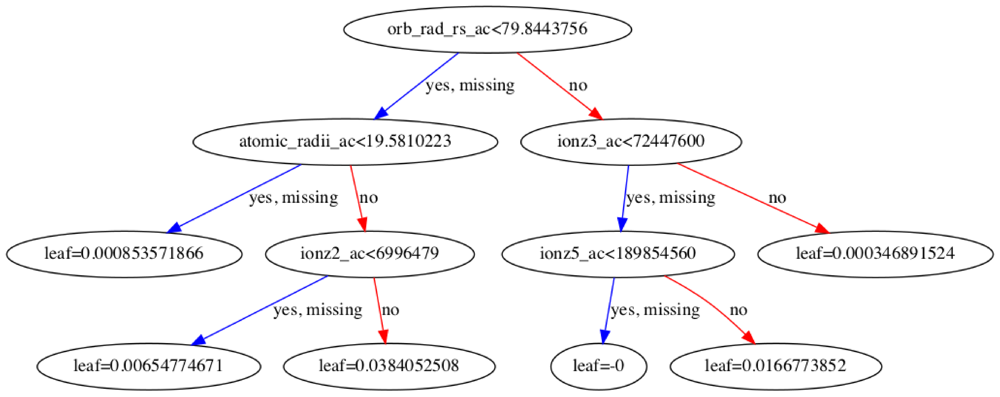

In [28]:

from matplotlib.pylab import rcParams

X_matrix = xgb.DMatrix(data = X, label = y)
params = {'colsample_bytree': 0.7, 'gamma': 0.11, 'learning_rate': 0.1, 'max_depth': 8, 'min_child_weight': 6, 'reg_alpha': 0.3, 'subsample': 1} 
xg_reg = xgb.train(dtrain = X_matrix, params = params, num_boost_round = 10000)
rcParams['figure.figsize'] = 80,50

xgb.plot_tree(xg_reg, num_trees = 20)
plt.show()

XGB CLASSIFIER


In [13]:
df['bandgap_categorical'] = df.iloc[:,-1].apply(lambda x: 1 if x < 0.6 else 0)

In [15]:
from sklearn.metrics import make_scorer, accuracy_score
X = df.drop('bandgap', axis= 1)  #explanatory variables
X = X.drop('bandgap_categorical', axis= 1)
y = df['bandgap_categorical'] #response variable

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

estimator = xgb.XGBClassifier()
print(estimator.get_params().keys())
param_grid = {
    'max_depth': [8],
    'learning_rate': [ 0.1],
    'min_child_weight': [4,5,6,8], 
    'gamma': [ 0.03],
    'subsample': [ 1, 0],
    'colsample_bytree': [0.3, 0.5, 0.7, 0.9],
    'reg_alpha': [0.1]}
   
gbm = GridSearchCV(estimator, param_grid, scoring='accuracy', cv=7, verbose=10, n_jobs=4,return_train_score=True)
gbm.fit(X_train,y_train)
print(gbm.cv_results_)
print('best parameters: {} '.format(gbm.best_params_))
print('best scores: {}'.format(np.abs(gbm.best_score_)))
best = gbm.best_estimator_

apsed:   12.2s
[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:   13.6s
[Parallel(n_jobs=4)]: Done 137 tasks      | elapsed:   15.0s
[Parallel(n_jobs=4)]: Done 154 tasks      | elapsed:   16.5s
[Parallel(n_jobs=4)]: Done 173 tasks      | elapsed:   18.3s
[Parallel(n_jobs=4)]: Done 192 tasks      | elapsed:   20.0s
[Parallel(n_jobs=4)]: Done 213 tasks      | elapsed:   22.0s
[18:19:03] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
{'mean_fit_time': array([0.53294931, 0.33927029, 0.52793751, 0.25090221, 0.39625423,
       0.2492561 , 0.38341788, 0.23041838, 0.46358252, 0.23222736,
       0.40238769, 0.25262186, 0.37784467, 0.25005003, 0.36610341,
       0.24087964, 0.47713661, 0.252543

<Figure size 576x432 with 0 Axes>

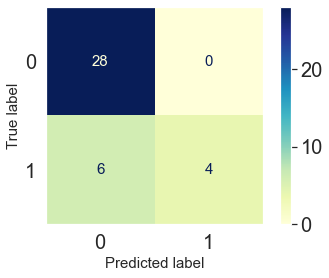

In [18]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
fig = plt.figure(figsize=(8, 6))
predictions = gbm.predict(X_test)
cm = confusion_matrix(y_test, predictions, labels=gbm.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=gbm.classes_)
disp.plot(cmap='YlGnBu')
plt.grid(False)

# roc curve

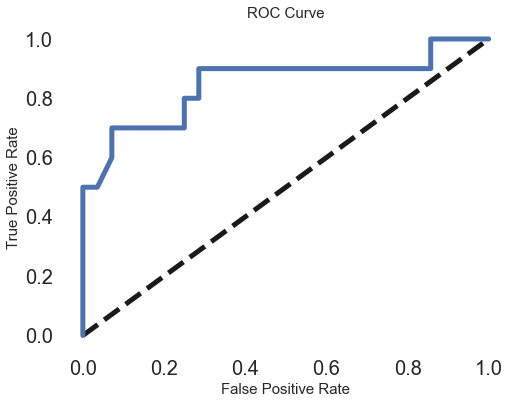

In [19]:
from sklearn.metrics import roc_curve
fig = plt.figure(figsize=(8, 6))
# Compute predicted probabilities: y_pred_prob
y_pred_prob = gbm.predict_proba(X_test)[:,1]

# Generate ROC curve values: fpr, tpr, thresholds
fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)

# Plot ROC curve
plt.plot([0, 1], [0, 1], 'k--', linewidth = 5)
ax = plt.gca()
ax.set_facecolor('white')
plt.plot(fpr, tpr, linewidth = 5)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')

plt.show()

In [32]:
import sklearn
sorted(sklearn.metrics.SCORERS.keys())

['accuracy',
 'adjusted_mutual_info_score',
 'adjusted_rand_score',
 'average_precision',
 'balanced_accuracy',
 'completeness_score',
 'explained_variance',
 'f1',
 'f1_macro',
 'f1_micro',
 'f1_samples',
 'f1_weighted',
 'fowlkes_mallows_score',
 'homogeneity_score',
 'jaccard',
 'jaccard_macro',
 'jaccard_micro',
 'jaccard_samples',
 'jaccard_weighted',
 'max_error',
 'mutual_info_score',
 'neg_brier_score',
 'neg_log_loss',
 'neg_mean_absolute_error',
 'neg_mean_gamma_deviance',
 'neg_mean_poisson_deviance',
 'neg_mean_squared_error',
 'neg_mean_squared_log_error',
 'neg_median_absolute_error',
 'neg_root_mean_squared_error',
 'normalized_mutual_info_score',
 'precision',
 'precision_macro',
 'precision_micro',
 'precision_samples',
 'precision_weighted',
 'r2',
 'recall',
 'recall_macro',
 'recall_micro',
 'recall_samples',
 'recall_weighted',
 'roc_auc',
 'roc_auc_ovo',
 'roc_auc_ovo_weighted',
 'roc_auc_ovr',
 'roc_auc_ovr_weighted',
 'v_measure_score']

In [16]:
important_features = pd.Series(best.feature_importances_, index = X.columns)

/Users/afridshirsekar/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


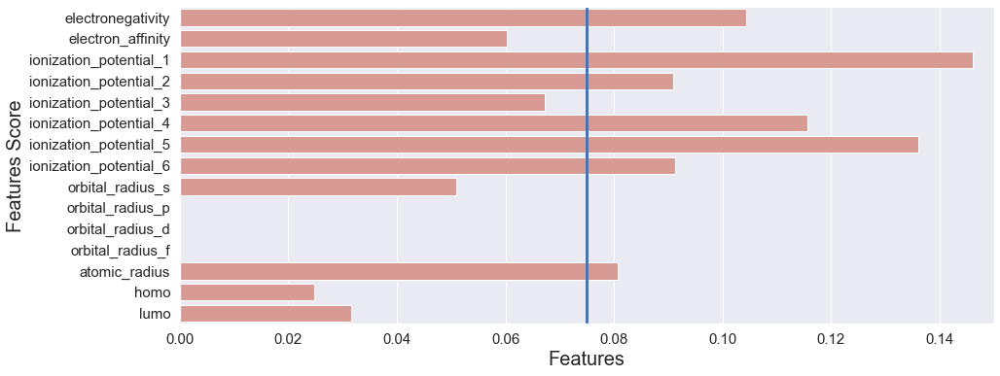

In [26]:
fig = plt.figure(figsize=(15, 6))

ax = sns.barplot(important_features.values, ['electronegativity', 'electron_affinity', 'ionization_potential_1', 'ionization_potential_2', 'ionization_potential_3', 'ionization_potential_4', 'ionization_potential_5', 'ionization_potential_6', 'orbital_radius_s', 'orbital_radius_p', 'orbital_radius_d', 'orbital_radius_f', 'atomic_radius', 'homo', 'lumo' ] , orient='h', color='salmon', saturation=.5)
ax.axvline(0.075, color='b', lw=3)

plt.rc('xtick', labelsize=20)
plt.rc('ytick', labelsize=20)
plt.xlabel('Features', fontsize = 20)
plt.ylabel('Features Score', fontsize = 20)
plt.tick_params(axis='both', labelsize = 15)
#plt.tick_params(axis='x', rotation = 90)
plt.xlim(0, 0.15);

In [27]:
df_new_1 = df.drop(['orb_rad_rp_ac', 'orb_rad_rd_ac', 'orb_rad_rf_ac'], axis = 1)

# 12 feature regressor

In [95]:
X = df_new_1.drop('bandgap', axis= 1)  #explanatory variables
X = X.drop('bandgap_categorical', axis= 1)
y = df_new_1['bandgap'] #response variable

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

estimator = xgb.XGBRegressor()
print(estimator.get_params().keys())
param_grid = {
    'max_depth': [8],
    'learning_rate': [ 0.1],
    'min_child_weight': [2,4,6,8], 
    'gamma': [ 0.03],
    'subsample': [ 0,0.52,1],
    'colsample_bytree': [0,1],
    'reg_alpha': [0.1]}
   
gbm = GridSearchCV(estimator, param_grid, scoring='neg_median_absolute_error', cv=7, verbose=10, n_jobs=4,return_train_score=True)
gbm.fit(X_train,y_train)
print(gbm.cv_results_)
print('best parameters: {} '.format(gbm.best_params_))
print('best scores: {}'.format(np.abs(gbm.best_score_)))
best = gbm.best_estimator_

dict_keys(['objective', 'base_score', 'booster', 'colsample_bylevel', 'colsample_bynode', 'colsample_bytree', 'gamma', 'gpu_id', 'importance_type', 'interaction_constraints', 'learning_rate', 'max_delta_step', 'max_depth', 'min_child_weight', 'missing', 'monotone_constraints', 'n_estimators', 'n_jobs', 'num_parallel_tree', 'random_state', 'reg_alpha', 'reg_lambda', 'scale_pos_weight', 'subsample', 'tree_method', 'validate_parameters', 'verbosity'])
Fitting 7 folds for each of 24 candidates, totalling 168 fits
[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done   5 tasks      | elapsed:    3.2s
[Parallel(n_jobs=4)]: Done  10 tasks      | elapsed:    4.2s
[Parallel(n_jobs=4)]: Done  17 tasks      | elapsed:    5.6s
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    6.2s
[Parallel(n_jobs=4)]: Done  33 tasks      | elapsed:    7.8s
[Parallel(n_jobs=4)]: Done  42 tasks      | elapsed:    9.3s
[Parallel(n_jobs=4)]: Done  53 tasks      | 

The rmse for the training model is: 0.10058901669402151
The rmse of test prediction is: 0.17064394196576282
The MAE of train prediction is: 0.07298494379673505
The MAE for the model is: 0.1236173098390479


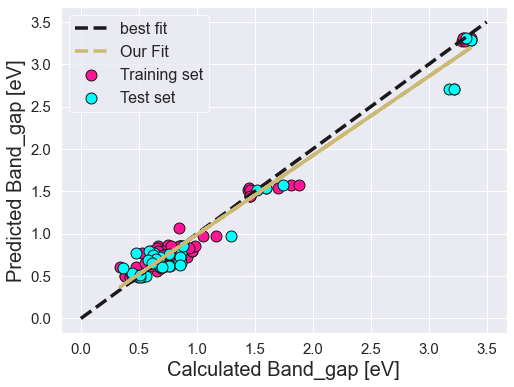

In [96]:
x_ref_line = [0, 3.5]
y_ref_line = [0, 3.5]
y_pred_train = best.predict(X_train)
y_pred_test = best.predict(X_test)
x1 = np.array(y_train)
y1 = np.array(y_pred_train)
x2 = np.array(y_test)
y2 = np.array(y_pred_test)

print('The rmse for the training model is:', mean_squared_error(y_train, y_pred_train) ** 0.5)
print('The rmse of test prediction is:', mean_squared_error(y_test, y_pred_test) ** 0.5)
print('The MAE of train prediction is:', mean_absolute_error(y_train, y_pred_train))
print('The MAE for the model is:', mean_absolute_error(y_test, y_pred_test))

fig = plt.figure(figsize=(8, 6))
plt.scatter(x1, y1, s=120, c='deeppink', edgecolors='k', linewidths=1, label='Training set')
plt.scatter(x2, y2, s=120, c='cyan', edgecolors='k', linewidths=1, label='Test set')

plt.plot(x_ref_line, y_ref_line, 'k--', linewidth=3.5, label = 'best fit')

z = np.polyfit(x1, y1, 1)
p = np.poly1d(z)
plt.plot(x1,p(x1),'y--', linewidth=3.5, label='Our Fit')

plt.rc('xtick', labelsize=20)
plt.rc('ytick', labelsize=20)
plt.xlabel('Calculated Band_gap [eV]', fontsize = 20)
plt.ylabel('Predicted Band_gap [eV]', fontsize = 20)
plt.tick_params(axis='both', labelsize = 15)
plt.legend(loc='upper left', fontsize = 16, ncol = 1).get_frame().set_edgecolor('w')
plt.grid(True)

# 11 feature regressor 

In [42]:
df_new_1 = df.drop(['hoe_ac', 'orb_rad_rp_ac', 'orb_rad_rd_ac', 'orb_rad_rf_ac' ], axis = 1) 

In [43]:
X = df_new_1.drop('bandgap', axis= 1)  #explanatory variables
X = X.drop('bandgap_categorical', axis= 1)
y = df['bandgap'] #response variable

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

estimator = xgb.XGBRegressor()
print(estimator.get_params().keys())
param_grid = {
    'max_depth': [8],
    'learning_rate': [ 0.1],
    'min_child_weight': [4,5,6,8], 
    'gamma': [ 0.03],
    'subsample': [ 0.52,1],
    'colsample_bytree': [0.3, 0.5, 0.7, 0.9],
    'reg_alpha': [0.1]}
   
gbm = GridSearchCV(estimator, param_grid, scoring='neg_median_absolute_error', cv=7, verbose=10, n_jobs=4,return_train_score=True)
gbm.fit(X_train,y_train)
print(gbm.cv_results_)
print('best parameters: {} '.format(gbm.best_params_))
print('best scores: {}'.format(np.abs(gbm.best_score_)))
best = gbm.best_estimator_

one  64 tasks      | elapsed:   13.6s
[Parallel(n_jobs=4)]: Done  77 tasks      | elapsed:   16.9s
[Parallel(n_jobs=4)]: Done  90 tasks      | elapsed:   20.5s
[Parallel(n_jobs=4)]: Done 105 tasks      | elapsed:   22.8s
[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:   26.1s
[Parallel(n_jobs=4)]: Done 137 tasks      | elapsed:   30.1s
[Parallel(n_jobs=4)]: Done 154 tasks      | elapsed:   33.6s
[Parallel(n_jobs=4)]: Done 173 tasks      | elapsed:   36.6s
[Parallel(n_jobs=4)]: Done 192 tasks      | elapsed:   40.5s
[Parallel(n_jobs=4)]: Done 213 tasks      | elapsed:   44.1s
{'mean_fit_time': array([0.69173166, 0.76075006, 0.56706813, 0.7021341 , 0.52493923,
       0.69404357, 0.54268384, 0.69910717, 0.64026894, 0.80397507,
       1.1325389 , 1.44019696, 0.65722169, 0.81945518, 0.54006032,
       0.74746864, 0.78377622, 0.97537862, 0.71034428, 1.37267934,
       0.73181183, 0.76647207, 0.52727771, 0.68331896, 0.71358187,
       0.89489654, 0.67626166, 0.82768239, 0.62181442, 0.778

The rmse for the training model is: 0.09237615692935248
The rmse of test prediction is: 0.1709474819903979
The MAE of train prediction is: 0.06399343974622927
The MAE for the model is: 0.11828707798636588


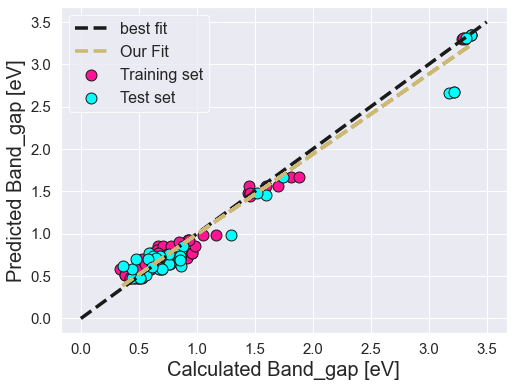

In [44]:
x_ref_line = [0, 3.5]
y_ref_line = [0, 3.5]
y_pred_train = best.predict(X_train)
y_pred_test = best.predict(X_test)
x1 = np.array(y_train)
y1 = np.array(y_pred_train)
x2 = np.array(y_test)
y2 = np.array(y_pred_test)

print('The rmse for the training model is:', mean_squared_error(y_train, y_pred_train) ** 0.5)
print('The rmse of test prediction is:', mean_squared_error(y_test, y_pred_test) ** 0.5)
print('The MAE of train prediction is:', mean_absolute_error(y_train, y_pred_train))
print('The MAE for the model is:', mean_absolute_error(y_test, y_pred_test))

fig = plt.figure(figsize=(8, 6))
plt.scatter(x1, y1, s=120, c='deeppink', edgecolors='k', linewidths=1, label='Training set')
plt.scatter(x2, y2, s=120, c='cyan', edgecolors='k', linewidths=1, label='Test set')

plt.plot(x_ref_line, y_ref_line, 'k--', linewidth=3.5, label = 'best fit')

z = np.polyfit(x1, y1, 1)
p = np.poly1d(z)
plt.plot(x1,p(x1),'y--', linewidth=3.5, label='Our Fit')

plt.rc('xtick', labelsize=20)
plt.rc('ytick', labelsize=20)
plt.xlabel('Calculated Band_gap [eV]', fontsize = 20)
plt.ylabel('Predicted Band_gap [eV]', fontsize = 20)
plt.tick_params(axis='both', labelsize = 15)
plt.legend(loc='upper left', fontsize = 16, ncol = 1).get_frame().set_edgecolor('w')
plt.grid(True)

# feature with 10 regressors 

In [45]:
df_new_1 = df_new_1.drop(['lue_ac'], axis = 1) 

In [47]:
X = df_new_1.drop('bandgap', axis= 1)  #explanatory variables
X = X.drop('bandgap_categorical', axis= 1)
y = df['bandgap'] #response variable

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

estimator = xgb.XGBRegressor()
print(estimator.get_params().keys())
param_grid = {
    'max_depth': [8],
    'learning_rate': [ 0.1],
    'min_child_weight': [4,5,6,8], 
    'gamma': [ 0.03],
    'subsample': [ 0.52,1],
    'colsample_bytree': [0.3, 0.5, 0.7, 0.9],
    'reg_alpha': [0.1]}
   
gbm = GridSearchCV(estimator, param_grid, scoring='neg_median_absolute_error', cv=7, verbose=10, n_jobs=4,return_train_score=True)
gbm.fit(X_train,y_train)
print(gbm.cv_results_)
print('best parameters: {} '.format(gbm.best_params_))
print('best scores: {}'.format(np.abs(gbm.best_score_)))
best = gbm.best_estimator_

 Done  64 tasks      | elapsed:   11.9s
[Parallel(n_jobs=4)]: Done  77 tasks      | elapsed:   14.9s
[Parallel(n_jobs=4)]: Done  90 tasks      | elapsed:   17.8s
[Parallel(n_jobs=4)]: Done 105 tasks      | elapsed:   20.5s
[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:   24.0s
[Parallel(n_jobs=4)]: Done 137 tasks      | elapsed:   27.6s
[Parallel(n_jobs=4)]: Done 154 tasks      | elapsed:   30.9s
[Parallel(n_jobs=4)]: Done 173 tasks      | elapsed:   34.6s
[Parallel(n_jobs=4)]: Done 192 tasks      | elapsed:   39.1s
[Parallel(n_jobs=4)]: Done 213 tasks      | elapsed:   42.9s
[Parallel(n_jobs=4)]: Done 224 out of 224 | elapsed:   45.0s finished
{'mean_fit_time': array([0.91263284, 0.8281951 , 0.58822458, 0.7829331 , 0.57178732,
       0.76313193, 0.52118267, 0.7440286 , 0.75100657, 0.97883987,
       0.7573938 , 0.99524065, 0.73420487, 0.91013653, 0.5987415 ,
       0.86924866, 0.88212044, 1.02201281, 0.73174926, 0.86769629,
       0.69562026, 0.87216847, 0.62906078, 0.87315519, 

The rmse for the training model is: 0.09286358349510301
The rmse of test prediction is: 0.17009151410234083
The MAE of train prediction is: 0.06616689113381034
The MAE for the model is: 0.11854943558472084


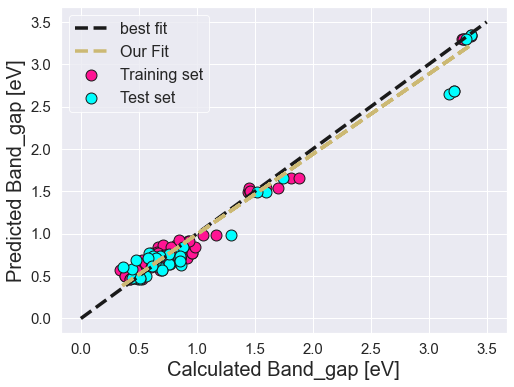

In [48]:
x_ref_line = [0, 3.5]
y_ref_line = [0, 3.5]
y_pred_train = best.predict(X_train)
y_pred_test = best.predict(X_test)
x1 = np.array(y_train)
y1 = np.array(y_pred_train)
x2 = np.array(y_test)
y2 = np.array(y_pred_test)

print('The rmse for the training model is:', mean_squared_error(y_train, y_pred_train) ** 0.5)
print('The rmse of test prediction is:', mean_squared_error(y_test, y_pred_test) ** 0.5)
print('The MAE of train prediction is:', mean_absolute_error(y_train, y_pred_train))
print('The MAE for the model is:', mean_absolute_error(y_test, y_pred_test))

fig = plt.figure(figsize=(8, 6))
plt.scatter(x1, y1, s=120, c='deeppink', edgecolors='k', linewidths=1, label='Training set')
plt.scatter(x2, y2, s=120, c='cyan', edgecolors='k', linewidths=1, label='Test set')

plt.plot(x_ref_line, y_ref_line, 'k--', linewidth=3.5, label = 'best fit')

z = np.polyfit(x1, y1, 1)
p = np.poly1d(z)
plt.plot(x1,p(x1),'y--', linewidth=3.5, label='Our Fit')

plt.rc('xtick', labelsize=20)
plt.rc('ytick', labelsize=20)
plt.xlabel('Calculated Band_gap [eV]', fontsize = 20)
plt.ylabel('Predicted Band_gap [eV]', fontsize = 20)
plt.tick_params(axis='both', labelsize = 15)
plt.legend(loc='upper left', fontsize = 16, ncol = 1).get_frame().set_edgecolor('w')
plt.grid(True)

# feature with 9 regressors 

In [50]:
df_new_1 = df_new_1.drop([ 'orb_rad_rs_ac'], axis = 1) 

In [51]:
X = df_new_1.drop('bandgap', axis= 1)  #explanatory variables
X = X.drop('bandgap_categorical', axis= 1)
y = df['bandgap'] #response variable

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

estimator = xgb.XGBRegressor()
print(estimator.get_params().keys())
param_grid = {
    'max_depth': [8],
    'learning_rate': [ 0.1],
    'min_child_weight': [4,5,6,8], 
    'gamma': [ 0.03],
    'subsample': [ 0.52,1],
    'colsample_bytree': [0.3, 0.5, 0.7, 0.9],
    'reg_alpha': [0.1]}
   
gbm = GridSearchCV(estimator, param_grid, scoring='neg_median_absolute_error', cv=7, verbose=10, n_jobs=4,return_train_score=True)
gbm.fit(X_train,y_train)
print(gbm.cv_results_)
print('best parameters: {} '.format(gbm.best_params_))
print('best scores: {}'.format(np.abs(gbm.best_score_)))
best = gbm.best_estimator_

Done  64 tasks      | elapsed:   12.1s
[Parallel(n_jobs=4)]: Done  77 tasks      | elapsed:   14.8s
[Parallel(n_jobs=4)]: Done  90 tasks      | elapsed:   17.6s
[Parallel(n_jobs=4)]: Done 105 tasks      | elapsed:   20.1s
[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:   23.8s
[Parallel(n_jobs=4)]: Done 137 tasks      | elapsed:   27.6s
[Parallel(n_jobs=4)]: Done 154 tasks      | elapsed:   30.7s
[Parallel(n_jobs=4)]: Done 173 tasks      | elapsed:   33.9s
[Parallel(n_jobs=4)]: Done 192 tasks      | elapsed:   38.5s
[Parallel(n_jobs=4)]: Done 213 tasks      | elapsed:   43.0s
[Parallel(n_jobs=4)]: Done 224 out of 224 | elapsed:   45.2s finished
{'mean_fit_time': array([0.65098238, 0.807221  , 0.6399497 , 0.80436897, 0.71814663,
       0.83667827, 0.52410231, 0.73043377, 0.81870307, 0.93562365,
       0.7341388 , 0.9701159 , 0.67749143, 0.7986361 , 0.58047557,
       0.92477942, 0.84906033, 1.053009  , 0.82559807, 0.95638473,
       0.63641896, 0.80216956, 0.56079187, 0.71808563, 0

The rmse for the training model is: 0.09239813659106544
The rmse of test prediction is: 0.17416933090510364
The MAE of train prediction is: 0.06496780406817637
The MAE for the model is: 0.12109114774357649


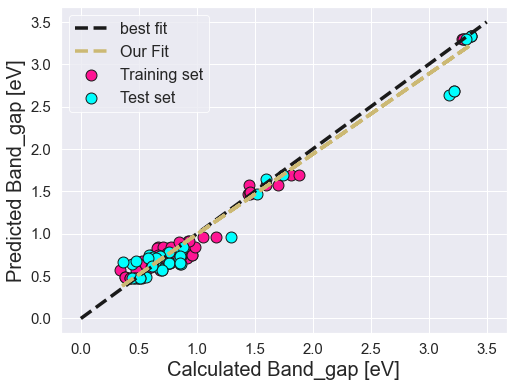

In [52]:
x_ref_line = [0, 3.5]
y_ref_line = [0, 3.5]
y_pred_train = best.predict(X_train)
y_pred_test = best.predict(X_test)
x1 = np.array(y_train)
y1 = np.array(y_pred_train)
x2 = np.array(y_test)
y2 = np.array(y_pred_test)

print('The rmse for the training model is:', mean_squared_error(y_train, y_pred_train) ** 0.5)
print('The rmse of test prediction is:', mean_squared_error(y_test, y_pred_test) ** 0.5)
print('The MAE of train prediction is:', mean_absolute_error(y_train, y_pred_train))
print('The MAE for the model is:', mean_absolute_error(y_test, y_pred_test))

fig = plt.figure(figsize=(8, 6))
plt.scatter(x1, y1, s=120, c='deeppink', edgecolors='k', linewidths=1, label='Training set')
plt.scatter(x2, y2, s=120, c='cyan', edgecolors='k', linewidths=1, label='Test set')

plt.plot(x_ref_line, y_ref_line, 'k--', linewidth=3.5, label = 'best fit')

z = np.polyfit(x1, y1, 1)
p = np.poly1d(z)
plt.plot(x1,p(x1),'y--', linewidth=3.5, label='Our Fit')

plt.rc('xtick', labelsize=20)
plt.rc('ytick', labelsize=20)
plt.xlabel('Calculated Band_gap [eV]', fontsize = 20)
plt.ylabel('Predicted Band_gap [eV]', fontsize = 20)
plt.tick_params(axis='both', labelsize = 15)
plt.legend(loc='upper left', fontsize = 16, ncol = 1).get_frame().set_edgecolor('w')
plt.grid(True)

In [62]:
df_new_1.head()

,elenega_ac,ionz1_ac,ionz2_ac,ionz3_ac,ionz4_ac,ionz5_ac,ionz6_ac,atomic_radii_ac,bandgap,bandgap_categorical
0,6.270561,1.846621e+06,6.995777e+06,6.593046e+07,1.873110e+08,2.895183e+08,4.523434e+08,20.114108,1.462422,0
1,6.270561,1.846621e+06,6.995777e+06,6.593046e+07,1.873110e+08,2.895183e+08,4.523434e+08,20.114108,1.462142,0
2,6.278165,1.846723e+06,6.996539e+06,6.638427e+07,1.872228e+08,2.893633e+08,4.519976e+08,20.114108,1.696664,0
3,6.278165,1.846723e+06,6.996539e+06,6.638427e+07,1.872228e+08,2.893633e+08,4.519976e+08,20.114108,1.595094,0
4,6.270561,1.846621e+06,6.995777e+06,6.593046e+07,1.873110e+08,2.895183e+08,4.523434e+08,20.114108,1.462773,0


# features with 8 regressors

In [54]:
df_new_1 = df_new_1.drop([ 'eleaff_ac'], axis = 1) 

In [65]:
X = df_new_1.drop('bandgap', axis= 1)  #explanatory variables
X = X.drop('bandgap_categorical', axis= 1)
y = df['bandgap'] #response variable

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

estimator = xgb.XGBRegressor()
print(estimator.get_params().keys())
param_grid = {
    'max_depth': [8],
    'learning_rate': [ 0.1],
    'min_child_weight': [ 2,4,5,6,8], 
    'gamma': [ 0.03],
    'subsample': [ 0.5,1],
    'colsample_bytree': [0.3],
    'reg_alpha': [0.1]}
   
gbm = GridSearchCV(estimator, param_grid, scoring='neg_median_absolute_error', cv=7, verbose=10, n_jobs=4,return_train_score=True)
gbm.fit(X_train,y_train)
print(gbm.cv_results_)
print('best parameters: {} '.format(gbm.best_params_))
print('best scores: {}'.format(np.abs(gbm.best_score_)))
best = gbm.best_estimator_

dict_keys(['objective', 'base_score', 'booster', 'colsample_bylevel', 'colsample_bynode', 'colsample_bytree', 'gamma', 'gpu_id', 'importance_type', 'interaction_constraints', 'learning_rate', 'max_delta_step', 'max_depth', 'min_child_weight', 'missing', 'monotone_constraints', 'n_estimators', 'n_jobs', 'num_parallel_tree', 'random_state', 'reg_alpha', 'reg_lambda', 'scale_pos_weight', 'subsample', 'tree_method', 'validate_parameters', 'verbosity'])
Fitting 7 folds for each of 10 candidates, totalling 70 fits
[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done   5 tasks      | elapsed:    1.5s
[Parallel(n_jobs=4)]: Done  10 tasks      | elapsed:    2.3s
[Parallel(n_jobs=4)]: Done  17 tasks      | elapsed:    3.6s
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    4.6s
[Parallel(n_jobs=4)]: Done  33 tasks      | elapsed:    6.5s
[Parallel(n_jobs=4)]: Done  42 tasks      | elapsed:    8.0s
[Parallel(n_jobs=4)]: Done  53 tasks      | e

The rmse for the training model is: 0.09304923008942506
The rmse of test prediction is: 0.17617735810986254
The MAE of train prediction is: 0.06532608878888582
The MAE for the model is: 0.12026883120205531


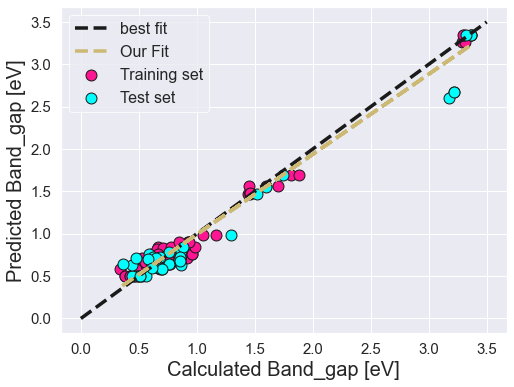

In [66]:
x_ref_line = [0, 3.5]
y_ref_line = [0, 3.5]
y_pred_train = best.predict(X_train)
y_pred_test = best.predict(X_test)
x1 = np.array(y_train)
y1 = np.array(y_pred_train)
x2 = np.array(y_test)
y2 = np.array(y_pred_test)

print('The rmse for the training model is:', mean_squared_error(y_train, y_pred_train) ** 0.5)
print('The rmse of test prediction is:', mean_squared_error(y_test, y_pred_test) ** 0.5)
print('The MAE of train prediction is:', mean_absolute_error(y_train, y_pred_train))
print('The MAE for the model is:', mean_absolute_error(y_test, y_pred_test))

fig = plt.figure(figsize=(8, 6))
plt.scatter(x1, y1, s=120, c='deeppink', edgecolors='k', linewidths=1, label='Training set')
plt.scatter(x2, y2, s=120, c='cyan', edgecolors='k', linewidths=1, label='Test set')

plt.plot(x_ref_line, y_ref_line, 'k--', linewidth=3.5, label = 'best fit')

z = np.polyfit(x1, y1, 1)
p = np.poly1d(z)
plt.plot(x1,p(x1),'y--', linewidth=3.5, label='Our Fit')

plt.rc('xtick', labelsize=20)
plt.rc('ytick', labelsize=20)
plt.xlabel('Calculated Band_gap [eV]', fontsize = 20)
plt.ylabel('Predicted Band_gap [eV]', fontsize = 20)
plt.tick_params(axis='both', labelsize = 15)
plt.legend(loc='upper left', fontsize = 16, ncol = 1).get_frame().set_edgecolor('w')
plt.grid(True)

# features with 7 regressors

In [100]:
df_new_1 = df.drop([ 'ionz3_ac', 'hoe_ac', 'lue_ac', 'orb_rad_rs_ac', 'orb_rad_rp_ac', 'orb_rad_rd_ac', 'orb_rad_rf_ac', 'eleaff_ac'], axis = 1) 

In [101]:
X = df_new_1.drop('bandgap', axis= 1)  #explanatory variables
X = X.drop('bandgap_categorical', axis= 1)
y = df['bandgap'] #response variable

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

estimator = xgb.XGBRegressor()
print(estimator.get_params().keys())
param_grid = {
    'max_depth': [2,4,6,8],
    'learning_rate': [ 0.1],
    'min_child_weight': [2,4,5,6,8], 
    'gamma': [ 0.03],
    'subsample': [ 0.5,1],
    'colsample_bytree': [0.3],
    'reg_alpha': [0.1]}
   
gbm = GridSearchCV(estimator, param_grid, scoring='neg_median_absolute_error', cv=7, verbose=10, n_jobs=4,return_train_score=True)
gbm.fit(X_train,y_train)
print(gbm.cv_results_)
print('best parameters: {} '.format(gbm.best_params_))
print('best scores: {}'.format(np.abs(gbm.best_score_)))
best = gbm.best_estimator_

 'param_learning_rate': masked_array(data=[0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1,
                   0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1,
                   0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1,
                   0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1],
             mask=[False, False, False, False, False, False, False, False,
                   False, False, False, False, False, False, False, False,
                   False, False, False, False, False, False, False, False,
                   False, False, False, False, False, False, False, False,
                   False, False, False, False, False, False, False, False],
       fill_value='?',
            dtype=object), 'param_max_depth': masked_array(data=[2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 4, 4, 4, 4, 4, 4, 4, 4,
                   4, 4, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 8, 8, 8, 8, 8, 8,
                   8, 8, 8, 8],
             mask=[False, False, False, False, False, False, False, False,
 

The rmse for the training model is: 0.08586803737594173
The rmse of test prediction is: 0.1518122275618162
The MAE of train prediction is: 0.06431647686383597
The MAE for the model is: 0.10954311747671432


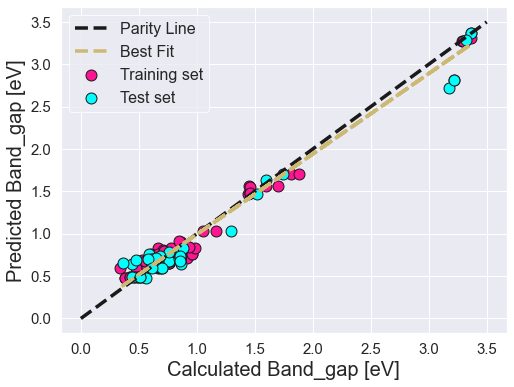

In [103]:
x_ref_line = [0, 3.5]
y_ref_line = [0, 3.5]
y_pred_train = best.predict(X_train)
y_pred_test = best.predict(X_test)
x1 = np.array(y_train)
y1 = np.array(y_pred_train)
x2 = np.array(y_test)
y2 = np.array(y_pred_test)

print('The rmse for the training model is:', mean_squared_error(y_train, y_pred_train) ** 0.5)
print('The rmse of test prediction is:', mean_squared_error(y_test, y_pred_test) ** 0.5)
print('The MAE of train prediction is:', mean_absolute_error(y_train, y_pred_train))
print('The MAE for the model is:', mean_absolute_error(y_test, y_pred_test))

fig = plt.figure(figsize=(8, 6))
plt.scatter(x1, y1, s=120, c='deeppink', edgecolors='k', linewidths=1, label='Training set')
plt.scatter(x2, y2, s=120, c='cyan', edgecolors='k', linewidths=1, label='Test set')

plt.plot(x_ref_line, y_ref_line, 'k--', linewidth=3.5, label = 'Parity Line')

z = np.polyfit(x1, y1, 1)
p = np.poly1d(z)
plt.plot(x1,p(x1),'y--', linewidth=3.5, label='Best Fit')

plt.rc('xtick', labelsize=20)
plt.rc('ytick', labelsize=20)
plt.xlabel('Calculated Band_gap [eV]', fontsize = 20)
plt.ylabel('Predicted Band_gap [eV]', fontsize = 20)
plt.tick_params(axis='both', labelsize = 15)
plt.legend(loc='upper left', fontsize = 16, ncol = 1).get_frame().set_edgecolor('w')
plt.grid(True)

# feature with 6 regressors

In [77]:
df_new_1 = df.drop([ 'hoe_ac', 'lue_ac', 'orb_rad_rs_ac', 'orb_rad_rp_ac', 'orb_rad_rd_ac', 'orb_rad_rf_ac', 'eleaff_ac', 'ionz3_ac', 'atomic_radii_ac'], axis = 1) 

In [78]:
X = df_new_1.drop('bandgap', axis= 1)  #explanatory variables
X = X.drop('bandgap_categorical', axis= 1)
y = df['bandgap'] #response variable

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

estimator = xgb.XGBRegressor()
print(estimator.get_params().keys())
param_grid = {
    'max_depth': [8],
    'learning_rate': [ 0.1],
    'min_child_weight': [ 2,4,5,6,8], 
    'gamma': [ 0.03],
    'subsample': [ 0.5,1],
    'colsample_bytree': [0.3],
    'reg_alpha': [0.1]}
   
gbm = GridSearchCV(estimator, param_grid, scoring='neg_median_absolute_error', cv=7, verbose=10, n_jobs=4,return_train_score=True)
gbm.fit(X_train,y_train)
print(gbm.cv_results_)
print('best parameters: {} '.format(gbm.best_params_))
print('best scores: {}'.format(np.abs(gbm.best_score_)))
best = gbm.best_estimator_

dict_keys(['objective', 'base_score', 'booster', 'colsample_bylevel', 'colsample_bynode', 'colsample_bytree', 'gamma', 'gpu_id', 'importance_type', 'interaction_constraints', 'learning_rate', 'max_delta_step', 'max_depth', 'min_child_weight', 'missing', 'monotone_constraints', 'n_estimators', 'n_jobs', 'num_parallel_tree', 'random_state', 'reg_alpha', 'reg_lambda', 'scale_pos_weight', 'subsample', 'tree_method', 'validate_parameters', 'verbosity'])
Fitting 7 folds for each of 10 candidates, totalling 70 fits
[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done   5 tasks      | elapsed:    3.9s
[Parallel(n_jobs=4)]: Done  10 tasks      | elapsed:    4.7s
[Parallel(n_jobs=4)]: Done  17 tasks      | elapsed:    5.9s
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    6.8s
[Parallel(n_jobs=4)]: Done  33 tasks      | elapsed:    8.4s
[Parallel(n_jobs=4)]: Done  42 tasks      | elapsed:    9.9s
[Parallel(n_jobs=4)]: Done  53 tasks      | e

The rmse for the training model is: 0.10624656340225272
The rmse of test prediction is: 0.20720692350781894
The MAE of train prediction is: 0.07129637552710584
The MAE for the model is: 0.12921990437537748


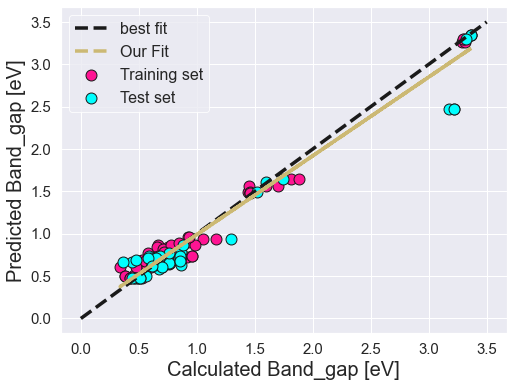

In [79]:
x_ref_line = [0, 3.5]
y_ref_line = [0, 3.5]
y_pred_train = best.predict(X_train)
y_pred_test = best.predict(X_test)
x1 = np.array(y_train)
y1 = np.array(y_pred_train)
x2 = np.array(y_test)
y2 = np.array(y_pred_test)

print('The rmse for the training model is:', mean_squared_error(y_train, y_pred_train) ** 0.5)
print('The rmse of test prediction is:', mean_squared_error(y_test, y_pred_test) ** 0.5)
print('The MAE of train prediction is:', mean_absolute_error(y_train, y_pred_train))
print('The MAE for the model is:', mean_absolute_error(y_test, y_pred_test))

fig = plt.figure(figsize=(8, 6))
plt.scatter(x1, y1, s=120, c='deeppink', edgecolors='k', linewidths=1, label='Training set')
plt.scatter(x2, y2, s=120, c='cyan', edgecolors='k', linewidths=1, label='Test set')

plt.plot(x_ref_line, y_ref_line, 'k--', linewidth=3.5, label = 'best fit')

z = np.polyfit(x1, y1, 1)
p = np.poly1d(z)
plt.plot(x1,p(x1),'y--', linewidth=3.5, label='Our Fit')

plt.rc('xtick', labelsize=20)
plt.rc('ytick', labelsize=20)
plt.xlabel('Calculated Band_gap [eV]', fontsize = 20)
plt.ylabel('Predicted Band_gap [eV]', fontsize = 20)
plt.tick_params(axis='both', labelsize = 15)
plt.legend(loc='upper left', fontsize = 16, ncol = 1).get_frame().set_edgecolor('w')
plt.grid(True)

In [88]:
df_new_1.head()

,elenega_ac,ionz1_ac,ionz4_ac,ionz5_ac,bandgap,bandgap_categorical
0,6.270561,1.846621e+06,1.873110e+08,2.895183e+08,1.462422,0
1,6.270561,1.846621e+06,1.873110e+08,2.895183e+08,1.462142,0
2,6.278165,1.846723e+06,1.872228e+08,2.893633e+08,1.696664,0
3,6.278165,1.846723e+06,1.872228e+08,2.893633e+08,1.595094,0
4,6.270561,1.846621e+06,1.873110e+08,2.895183e+08,1.462773,0


# 4 feature regressor

In [81]:
df_new_1 = df_new_1.drop([ 'ionz2_ac', 'ionz6_ac'], axis = 1) 

In [89]:
X = df_new_1.drop('bandgap', axis= 1)  #explanatory variables
X = X.drop('bandgap_categorical', axis= 1)
y = df['bandgap'] #response variable

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

estimator = xgb.XGBRegressor()
print(estimator.get_params().keys())
param_grid = {
    'max_depth': [8],
    'learning_rate': [ 0.1],
    'min_child_weight': [ 2,4,5,6,8], 
    'gamma': [ 0.03],
    'subsample': [ 0.5,1],
    'colsample_bytree': [0.3],
    'reg_alpha': [0.1]}
   
gbm = GridSearchCV(estimator, param_grid, scoring='neg_median_absolute_error', cv=7, verbose=10, n_jobs=4,return_train_score=True)
gbm.fit(X_train,y_train)
print(gbm.cv_results_)
print('best parameters: {} '.format(gbm.best_params_))
print('best scores: {}'.format(np.abs(gbm.best_score_)))
best = gbm.best_estimator_

dict_keys(['objective', 'base_score', 'booster', 'colsample_bylevel', 'colsample_bynode', 'colsample_bytree', 'gamma', 'gpu_id', 'importance_type', 'interaction_constraints', 'learning_rate', 'max_delta_step', 'max_depth', 'min_child_weight', 'missing', 'monotone_constraints', 'n_estimators', 'n_jobs', 'num_parallel_tree', 'random_state', 'reg_alpha', 'reg_lambda', 'scale_pos_weight', 'subsample', 'tree_method', 'validate_parameters', 'verbosity'])
Fitting 7 folds for each of 10 candidates, totalling 70 fits
[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done   5 tasks      | elapsed:    1.4s
[Parallel(n_jobs=4)]: Done  10 tasks      | elapsed:    2.4s
[Parallel(n_jobs=4)]: Done  17 tasks      | elapsed:    3.7s
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    4.9s
[Parallel(n_jobs=4)]: Done  33 tasks      | elapsed:    6.7s
[Parallel(n_jobs=4)]: Done  42 tasks      | elapsed:    8.3s
[Parallel(n_jobs=4)]: Done  53 tasks      | e

The rmse for the training model is: 0.09927774146557258
The rmse of test prediction is: 0.17458715643676584
The MAE of train prediction is: 0.07339626354378147
The MAE for the model is: 0.12114855619229771


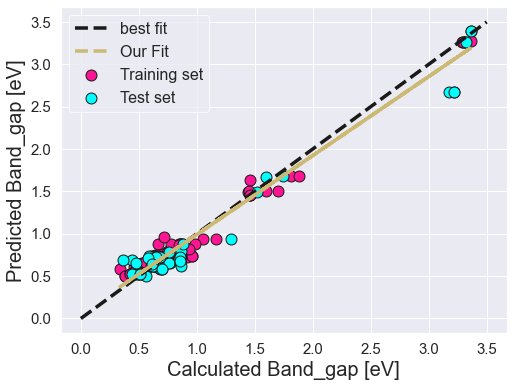

In [90]:
x_ref_line = [0, 3.5]
y_ref_line = [0, 3.5]
y_pred_train = best.predict(X_train)
y_pred_test = best.predict(X_test)
x1 = np.array(y_train)
y1 = np.array(y_pred_train)
x2 = np.array(y_test)
y2 = np.array(y_pred_test)

print('The rmse for the training model is:', mean_squared_error(y_train, y_pred_train) ** 0.5)
print('The rmse of test prediction is:', mean_squared_error(y_test, y_pred_test) ** 0.5)
print('The MAE of train prediction is:', mean_absolute_error(y_train, y_pred_train))
print('The MAE for the model is:', mean_absolute_error(y_test, y_pred_test))

fig = plt.figure(figsize=(8, 6))
plt.scatter(x1, y1, s=120, c='deeppink', edgecolors='k', linewidths=1, label='Training set')
plt.scatter(x2, y2, s=120, c='cyan', edgecolors='k', linewidths=1, label='Test set')

plt.plot(x_ref_line, y_ref_line, 'k--', linewidth=3.5, label = 'best fit')

z = np.polyfit(x1, y1, 1)
p = np.poly1d(z)
plt.plot(x1,p(x1),'y--', linewidth=3.5, label='Our Fit')

plt.rc('xtick', labelsize=20)
plt.rc('ytick', labelsize=20)
plt.xlabel('Calculated Band_gap [eV]', fontsize = 20)
plt.ylabel('Predicted Band_gap [eV]', fontsize = 20)
plt.tick_params(axis='both', labelsize = 15)
plt.legend(loc='upper left', fontsize = 16, ncol = 1).get_frame().set_edgecolor('w')
plt.grid(True)

# features with 3 regressors

In [91]:
df_new_1 = df_new_1.drop([ 'elenega_ac'], axis = 1) 

In [92]:
X = df_new_1.drop('bandgap', axis= 1)  #explanatory variables
X = X.drop('bandgap_categorical', axis= 1)
y = df['bandgap'] #response variable

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

estimator = xgb.XGBRegressor()
print(estimator.get_params().keys())
param_grid = {
    'max_depth': [8],
    'learning_rate': [ 0.1],
    'min_child_weight': [ 2,4,5,6,8], 
    'gamma': [ 0.03],
    'subsample': [ 0.5,1],
    'colsample_bytree': [0.3],
    'reg_alpha': [0.1]}
   
gbm = GridSearchCV(estimator, param_grid, scoring='neg_median_absolute_error', cv=7, verbose=10, n_jobs=4,return_train_score=True)
gbm.fit(X_train,y_train)
print(gbm.cv_results_)
print('best parameters: {} '.format(gbm.best_params_))
print('best scores: {}'.format(np.abs(gbm.best_score_)))
best = gbm.best_estimator_

dict_keys(['objective', 'base_score', 'booster', 'colsample_bylevel', 'colsample_bynode', 'colsample_bytree', 'gamma', 'gpu_id', 'importance_type', 'interaction_constraints', 'learning_rate', 'max_delta_step', 'max_depth', 'min_child_weight', 'missing', 'monotone_constraints', 'n_estimators', 'n_jobs', 'num_parallel_tree', 'random_state', 'reg_alpha', 'reg_lambda', 'scale_pos_weight', 'subsample', 'tree_method', 'validate_parameters', 'verbosity'])
Fitting 7 folds for each of 10 candidates, totalling 70 fits
[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done   5 tasks      | elapsed:    1.7s
[Parallel(n_jobs=4)]: Done  10 tasks      | elapsed:    2.5s
[Parallel(n_jobs=4)]: Done  17 tasks      | elapsed:    3.8s
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    4.8s
[Parallel(n_jobs=4)]: Done  33 tasks      | elapsed:    7.4s
[Parallel(n_jobs=4)]: Done  42 tasks      | elapsed:   11.0s
[Parallel(n_jobs=4)]: Done  53 tasks      | e

The rmse for the training model is: 0.13049594799920694
The rmse of test prediction is: 0.2624890474072332
The MAE of train prediction is: 0.08589663602397316
The MAE for the model is: 0.1578253939661729


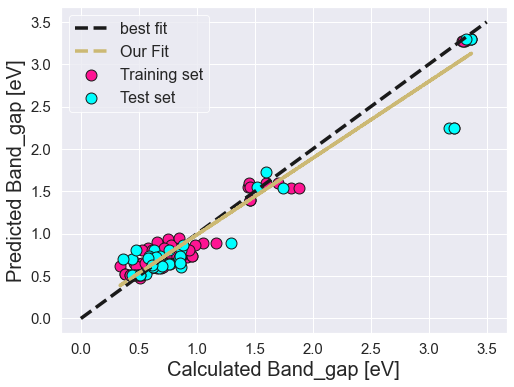

In [94]:
x_ref_line = [0, 3.5]
y_ref_line = [0, 3.5]
y_pred_train = best.predict(X_train)
y_pred_test = best.predict(X_test)
x1 = np.array(y_train)
y1 = np.array(y_pred_train)
x2 = np.array(y_test)
y2 = np.array(y_pred_test)

print('The rmse for the training model is:', mean_squared_error(y_train, y_pred_train) ** 0.5)
print('The rmse of test prediction is:', mean_squared_error(y_test, y_pred_test) ** 0.5)
print('The MAE of train prediction is:', mean_absolute_error(y_train, y_pred_train))
print('The MAE for the model is:', mean_absolute_error(y_test, y_pred_test))

fig = plt.figure(figsize=(8, 6))
plt.scatter(x1, y1, s=120, c='deeppink', edgecolors='k', linewidths=1, label='Training set')
plt.scatter(x2, y2, s=120, c='cyan', edgecolors='k', linewidths=1, label='Test set')

plt.plot(x_ref_line, y_ref_line, 'k--', linewidth=3.5, label = 'best fit')

z = np.polyfit(x1, y1, 1)
p = np.poly1d(z)
plt.plot(x1,p(x1),'y--', linewidth=3.5, label='Our Fit')

plt.rc('xtick', labelsize=20)
plt.rc('ytick', labelsize=20)
plt.xlabel('Calculated Band_gap [eV]', fontsize = 20)
plt.ylabel('Predicted Band_gap [eV]', fontsize = 20)
plt.tick_params(axis='both', labelsize = 15)
plt.legend(loc='upper left', fontsize = 16, ncol = 1).get_frame().set_edgecolor('w')
plt.grid(True)

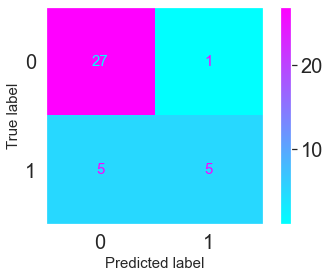

In [197]:
predictions = gbm.predict(X_test)
cm = confusion_matrix(y_test, predictions, labels=gbm.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=gbm.classes_)
disp.plot(cmap='cool')
plt.grid(False)


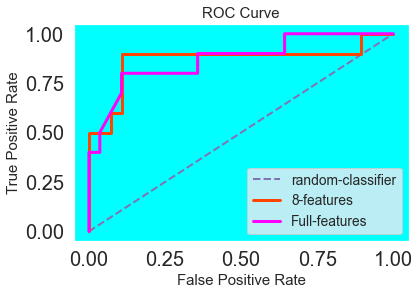

In [205]:
y_pred_prob = gbm.predict_proba(X_test)[:,1]
y_pred_prob1 = gbm1.predict_proba(X_test1)[:,1]
# Generate ROC curve values: fpr, tpr, thresholds
fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)
fpr1, tpr1, thresholds1 = roc_curve(y_test1, y_pred_prob1)
# Plot ROC curve
plt.plot([0, 1], [0, 1], 'm--', linewidth = 2)
ax = plt.gca()
ax.set_facecolor('cyan')
plt.plot(fpr, tpr, '#FF4500', linewidth = 3)
plt.plot(fpr1, tpr1, 'magenta', linewidth = 3)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.grid(False)
plt.legend(['random-classifier', '8-features', 'Full-features'])
plt.show()